# Problem set 2 (40 + 36 + 35 = 111 pts)

In this problem set we also present some bonus problems that will be considered as in Problem Set 1.

## Problem 1. Segmentation. (40 pts)
In this task, you will need to solve the problem of semantic segmentation of the attributes of a person's face. You will work with [CelebAMask-HQ](https://github.com/switchablenorms/CelebAMask-HQ) dataset. You are free to solve and implement required steps on your own. However, there are several constraints and advices:
- To speed up and simplify experiments, you can transform images to 512x512 resolution and use this [train-test split](https://drive.google.com/file/d/1vO4mJ08FMdcom2-sNs4WHxPztIRYrFYI/view?usp=share_link), that has smaller number of images.
- (20 pts) Implement needed train-test pipeline (dataset, model, train and test loops), train and test the model. 
  - (10 pts) Bonus: your own model, not taken from libraries and not a Unet.
- (5 pts) Report IoU and Dice-scores of each class on the test set.
- (5 pts) Try to add augmentations (helpful [link1](https://albumentations.ai/) and [link2](https://kornia.github.io/)).
- (2 pts) Plot 4-6 examples of obtained results on the test set (show the best and the worst according to the loss/metrics).
- (3 pts) Explain why you solved the problem this way and not otherwise, provide description of experiments and their results. Analyze your metrics, are they suitable?
- (5 pts) Make additional function for inference that receives path to the image. Test your model on several photos not from the dataset (pick your own photo or any other from internet). Does your model work well on the new data?
- Do not use already pretrained on CelebAMask-HQ models.
- **Bonus**: 
  - **+10 points** for top-1 result
  - **+8 points** for 2-3 places
  - **+5 points** for 4-8 places 
according to reported mean Dice score on the provided test split.

In [ ]:
import os
import torch
from torchvision import transforms
import numpy as np
import pandas as pd
from PIL import Image
import cv2
import matplotlib.pyplot as plt
%matplotlib inline


In [ ]:
#Combiner cell
# # color_list = [[0, 0, 0], [204, 0, 0], [76, 153, 0], [204, 204, 0], [51, 51, 255], [204, 0, 204], [0, 255, 255], [255, 204, 204], [102, 51, 0], [255, 0, 0], [102, 204, 0], [255, 255, 0], [0, 0, 153], [0, 0, 204], [255, 51, 153], [0, 204, 204], [0, 51, 0], [255, 153, 51], [0, 204, 0]]
# label_list = ['skin', 'nose', 'eye_g', 'l_eye', 'r_eye', 'l_brow', 'r_brow', 'l_ear', 'r_ear', 'mouth', 'u_lip', 'l_lip', 'hair', 'hat', 'ear_r', 'neck_l', 'neck', 'cloth']
# old_mask_folder = 'CelebAMask-HQ/CelebAMask-HQ-mask-anno'
# new_mask_folder = 'CelebAMask-HQ/CelebAMask-HQ-Mask'
# dff = pd.read_csv('./CelebAMask-HQ/celeb_train_test_split.csv')
# splitted_files = dff.name.values

# for k in range(15):
#     for i in range(2000):
#       file_num = 2000*k + i
#       if (str(file_num)+'.jpg') in splitted_files:
#         im_ = np.zeros((512, 512))
#         for idx, label in enumerate(label_list):
#             filename = os.path.join(old_mask_folder, str(k), str(file_num).rjust(5, '0') + '_' + label + '.png')
#             if (os.path.exists(filename)):
#                 im = cv2.imread(filename)
#                 im = im[:, :, 0]
#                 im_[im != 0] = (idx + 1)
#         filename_save = os.path.join(new_mask_folder, str(file_num) + '.png')
#         print(filename_save)
#         cv2.imwrite(filename_save, im_)

In [ ]:
class Encoder_Block(torch.nn.Module):
  def __init__(self,inp_channels,out_channels):
    super().__init__()
    self.model = torch.nn.Sequential(
        torch.nn.Conv2d(inp_channels,out_channels,kernel_size=3,padding=1),
        torch.nn.BatchNorm2d(out_channels),
        torch.nn.ReLU(),
        torch.nn.Conv2d(out_channels,out_channels,kernel_size=3,padding=1),
        torch.nn.BatchNorm2d(out_channels),
        torch.nn.ReLU(),
    )
    self.pooling = torch.nn.MaxPool2d(2)
  def forward(self,x):
    int_out = self.model(x)
    return self.pooling(int_out), int_out

class Decoder_Block(torch.nn.Module):
  def __init__(self,inp_channels,out_channels):
    super().__init__()
    self.upsample = torch.nn.ConvTranspose2d(inp_channels,out_channels,kernel_size=2,stride=2)
    self.model = torch.nn.Sequential(
        torch.nn.Conv2d(inp_channels,out_channels,kernel_size=3,padding=1),
        torch.nn.BatchNorm2d(out_channels),
        torch.nn.ReLU(),
        torch.nn.Conv2d(out_channels,out_channels,kernel_size=3,padding=1),
        torch.nn.BatchNorm2d(out_channels),
        torch.nn.ReLU(),
    )
  def forward(self,x,enc_x):
    x = self.upsample(x)
    x = torch.cat([x,enc_x],dim=1)
    return self.model(x)

class Unet(torch.nn.Module):
  def __init__(self,inc,outc,hidden_size=64):
    super().__init__()
    self.Encoder = torch.nn.ModuleList([
        Encoder_Block(inc,hidden_size),
        Encoder_Block(hidden_size,hidden_size*2),
        Encoder_Block(hidden_size*2,hidden_size*4),
        Encoder_Block(hidden_size*4,hidden_size*8),
    ])
    self.bottleneck = torch.nn.Sequential(
        torch.nn.Conv2d(hidden_size*8,hidden_size*16,kernel_size=1),
        torch.nn.BatchNorm2d(hidden_size*16),
        torch.nn.ReLU(),
        torch.nn.Conv2d(hidden_size*16,hidden_size*16,kernel_size=1),
        torch.nn.BatchNorm2d(hidden_size*16),
        torch.nn.ReLU()
    )
    self.Decoder = torch.nn.ModuleList([
        Decoder_Block(hidden_size*16,hidden_size*8),
        Decoder_Block(hidden_size*8,hidden_size*4),
        Decoder_Block(hidden_size*4,hidden_size*2),
        Decoder_Block(hidden_size*2,hidden_size*1),
    ])
    self.last_layer = torch.nn.Conv2d(hidden_size,outc,kernel_size=3,padding="same")
  def forward(self,x):
    enc_xs = []
    for module in self.Encoder:
      x, enc_x= module(x)
      enc_xs.append(enc_x)
    
    enc_xs = enc_xs[::-1]
    x = self.bottleneck(x)

    for i,module in enumerate(self.Decoder):
      x = module(x,enc_xs[i])
    return self.last_layer(x)

In [ ]:
class CelebAMaskHQDataset():
  def __init__(self, img_path, label_path, img_transform, image_names):
    self.img_path = img_path
    self.lbl_path = label_path
    self.img_transform = img_transform
    self.dataset = image_names
    # self.preprocess()
    self.num_images = len(self.dataset)

  def __len__(self):
    return self.num_images
    
  def __getitem__(self, idx):
    image_path, label_path = self.dataset[idx], self.dataset[idx][:-4]+'.png'
    img = Image.open(os.path.join(self.img_path, image_path))
    label = Image.open(os.path.join(self.lbl_path, label_path))
    label = self.class_split(label)
    return self.img_transform(img), label

  def class_split(self, label):
    data = np.array(label)
    res = []
    for i in range(19):
      mask = np.zeros_like(data)
      mask[data==i] = 1.
      res.append(mask[None])
    return torch.from_numpy(np.concatenate(res,axis=0)).to(torch.float)

In [ ]:
def train(model, dataloader, criterion, optimizer, num_epochs, device):
  model.train()
  for epoch in range(num_epochs):
    print('Epoch {}/{}'.format(epoch + 1, num_epochs))
    running_loss = 0
    iou = []
    for batch_idx, (input, labels) in enumerate(dataloader):
      input = input.to(device)
      labels = labels.to(device)

      optimizer.zero_grad()
      output = model(input)
      loss = criterion(output, torch.argmax(labels.long(), dim=1))

      loss.backward()
      optimizer.step()

      running_loss += loss.item()*input.size(0)

    epoch_loss = running_loss / len(dataloader.dataset)
    print('loss: ', epoch_loss)


def test(model, dataloader, criterion, device):
  model.eval()
  running_loss = 0
  iou = np.zeros(19)
  dice = np.zeros(19)
  with torch.inference_mode():
    for batch_idx, (input, labels) in enumerate(dataloader):
      input = input.to(device)
      labels = labels.to(device)

      output = model(input)
      out_ = output.detach().cpu().numpy()
      label_ = labels.detach().cpu().numpy()
      out_ = np.array([np.argmax(out_, axis=1)==i for i in range(19)]).transpose(1,0,2,3)
      inter_ = np.sum(np.logical_and(out_, label_), axis=(2,3))
      union_ = np.sum(np.logical_or(out_, label_), axis=(2,3))
      comb_ = np.sum(np.abs(out_), axis=(2,3)) + np.sum(np.abs(label_), axis=(2,3))
      iou_ = (inter_ + 0.001) / (union_ + 0.001)
      dice_ = (2*inter_ + 0.001) / (comb_ + 0.001)
      iou += np.sum(iou_, axis=0)
      dice += np.sum(dice_, axis=0)

      loss = criterion(output, torch.argmax(labels.long(), dim=1))
      running_loss += loss.item()*input.size(0)

    test_loss = running_loss / len(dataloader.dataset)
    iou_per_class = iou / len(dataloader.dataset)
    dice_per_class = dice / len(dataloader.dataset)

    print('test loss: ', test_loss)
    print('Mean intersection over union per class: ', iou_per_class)
    print('Dice per class: ', dice_per_class)


In [ ]:
img_path = 'CelebAMask-HQ/CelebA-HQ-img'
label_path = 'CelebAMask-HQ/CelebAMask-HQ-Mask'
img_transform = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.ToTensor(),
    transforms.Normalize(mean=0.5,std=0.5)
])
df_split = pd.read_csv('./CelebAMask-HQ/celeb_train_test_split.csv')
train_is = df_split[df_split.is_train == True]
test_is = df_split[df_split.is_train == False]
train_names = train_is.name.values
test_names = test_is.name.values
train_dataset = CelebAMaskHQDataset(img_path, label_path, img_transform, train_names)
test_dataset = CelebAMaskHQDataset(img_path, label_path, img_transform, test_names)

In [ ]:
#!g1.1
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = Unet(3, 19).to(device)
criterion = torch.nn.CrossEntropyLoss()
train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=8, shuffle=True)
optimizer = torch.optim.Adam(model.parameters(),lr=1e-3)
num_epochs = 10
train(model, train_dataloader, criterion, optimizer, num_epochs, device)

Epoch 1/10
loss:  0.9278120905558268
Epoch 2/10
loss:  0.6454148785909017
Epoch 3/10
loss:  0.5415312480926514
Epoch 4/10
loss:  0.48615695886611937
Epoch 5/10
loss:  0.4371865018526713
Epoch 6/10
loss:  0.39953089292844135
Epoch 7/10
loss:  0.36606882486343384
Epoch 8/10
loss:  0.3434868175824483
Epoch 9/10
loss:  0.32771453404426576
Epoch 10/10
loss:  0.3096014833132426


In [ ]:
#!g1.1
# ['skin', 'nose', 'eye_g', 'l_eye', 'r_eye', 'l_brow', 'r_brow', 'l_ear', 'r_ear', 'mouth', 'u_lip', 'l_lip', 'hair', 'hat', 'ear_r', 'neck_l', 'neck', 'cloth']
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
test_dataloader = torch.utils.data.DataLoader(test_dataset, batch_size=8, shuffle=False)
test(model, test_dataloader, criterion, device)

test loss:  0.30354409923553466
Mean intersection over union per class:  [0.83446982 0.88526913 0.85195121 0.5912101  0.6269795  0.65638628
 0.63817141 0.6378861  0.66341349 0.59006744 0.63016255 0.6393897
 0.71750175 0.80017226 0.52493864 0.55668392 0.95840322 0.68814197
 0.39587879]
Dice per class:  [0.90120489 0.93735048 0.91752188 0.59769359 0.72495836 0.76401303
 0.74027551 0.74124285 0.71361792 0.64023349 0.68335465 0.74938473
 0.81369344 0.86931156 0.53004975 0.58349217 0.95840322 0.77858398
 0.45987023]


In [ ]:
augumentation = transforms.Compose([
    transforms.Resize(512),
    transforms.ColorJitter(brightness=0, contrast=(1,5), saturation=(0,10), hue=0),
    transforms.GaussianBlur(kernel_size=(25,31), sigma=(20,25)),
    transforms.ToTensor(),
    transforms.Normalize(mean=0.5,std=0.5)
])
train_dataset_augu = CelebAMaskHQDataset(img_path, label_path, augumentation, train_names)
test_dataset_augu = CelebAMaskHQDataset(img_path, label_path, augumentation, test_names)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = Unet(3, 19).to(device)
criterion = torch.nn.CrossEntropyLoss()
train_dataloader = torch.utils.data.DataLoader(train_dataset_augu, batch_size=8, shuffle=True)
optimizer = torch.optim.Adam(model.parameters(),lr=1e-3)
num_epochs = 10
train(model, train_dataloader, criterion, optimizer, num_epochs, device)

Epoch 1/10
loss:  1.2500921272913614
Epoch 2/10
loss:  1.1206985140800476
Epoch 3/10
loss:  1.0265850150108338
Epoch 4/10
loss:  0.946819677511851
Epoch 5/10
loss:  0.8899237907091776
Epoch 6/10
loss:  0.8440926606814066
Epoch 7/10
loss:  0.7960708521842956
Epoch 8/10
loss:  0.7460302210172017
Epoch 9/10
loss:  0.7036887319882711
Epoch 10/10
loss:  0.6683174192110698


In [ ]:
#!g1.1
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
test_dataloader = torch.utils.data.DataLoader(test_dataset_augu, batch_size=8, shuffle=False)
test(model, test_dataloader, criterion, device)

test loss:  0.6741815740585327
Mean intersection over union per class:  [0.64830192 0.72110654 0.64802001 0.56884695 0.43942378 0.42796062
 0.38485393 0.35093445 0.46302727 0.50365861 0.30952515 0.40506852
 0.47393297 0.59784274 0.82952414 0.7410083  0.95840322 0.5037207
 0.23626715]
Dice per class:  [0.76459594 0.83090747 0.76704671 0.57096577 0.55359456 0.53860175
 0.4973176  0.45206385 0.50517469 0.53589328 0.37496694 0.53218858
 0.59975576 0.71965261 0.83014291 0.74114309 0.95840322 0.63712078
 0.30144463]


Not enough units in PROJECT to continue executions. Please contact your PROJECT admin.


In [ ]:
#!g1.1
def inference3(model, paths, device):
    fig = plt.figure(figsize=(10, 7))
    rows = 3
    columns = 2
    color_list = [[0, 0, 0], [204, 0, 0], [76, 153, 0], [204, 204, 0], [51, 51, 255], [204, 0, 204], [0, 255, 255], [255, 204, 204], [102, 51, 0], [255, 0, 0], [102, 204, 0], [255, 255, 0], [0, 0, 153], [0, 0, 204], [255, 51, 153], [0, 204, 204], [0, 51, 0], [255, 153, 51], [0, 204, 0]]
    for path in range(len(paths)):
      if (os.path.exists(paths[path])):
          im_base = np.zeros((512, 512, 3))
          im = Image.open(paths[path])
          img = img_transform(im)[:3][None].to(device)         
          masks = model(img)[0]
          a = np.argmax(masks.detach().cpu().numpy(), axis=0)
          for idx, color in enumerate(color_list):
              im_base[a == idx] = color
      im.show()
      cv2_imshow(im_base)

def inference2(model, img_paths, mask_paths, criterion, device):
    color_list = [[0, 0, 0], [204, 0, 0], [76, 153, 0], [204, 204, 0], [51, 51, 255], [204, 0, 204], [0, 255, 255], [255, 204, 204], [102, 51, 0], [255, 0, 0], [102, 204, 0], [255, 255, 0], [0, 0, 153], [0, 0, 204], [255, 51, 153], [0, 204, 204], [0, 51, 0], [255, 153, 51], [0, 204, 0]]
    model.eval()
    with torch.inference_mode():
      for i in range(len(img_paths)):
        if (os.path.exists(img_paths[i])):
          # print(True)
          im_base = np.zeros((512, 512, 3))
          im_mask = Image.open(mask_paths[i])
          im_mask = class_split(im_mask)
          im_mask = torch.tensor(np.array(im_mask), dtype=torch.float) 
          im_mask = im_mask[:19][None].to(device)
          im = Image.open(img_paths[i])
          img = img_transform(im)[:3][None].to(device)
          masks_o = model(img)
          out_ = masks_o.detach().cpu().numpy()
          label_ = im_mask.detach().cpu().numpy()
          out_ = np.array([np.argmax(out_, axis=1)==i for i in range(19)]).transpose(1,0,2,3)
          inter_ = np.sum(np.logical_and(out_, label_), axis=(2,3))
          comb_ = np.sum(np.abs(out_), axis=(2,3)) + np.sum(np.abs(label_), axis=(2,3))
          dice_ = (2*inter_ + 0.001) / (comb_ + 0.001)
          print(dice_.mean())
          masks_o = masks_o.detach().cpu().numpy()
          a = np.argmax(masks_o[0], axis=0)
          for idx, color in enumerate(color_list):
              im_base[a == idx] = color
          cv2_imshow(im_base)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


0.7411247469836449


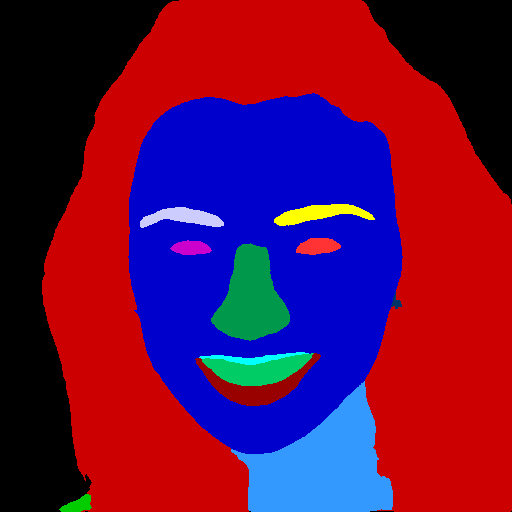

0.8994398053309482


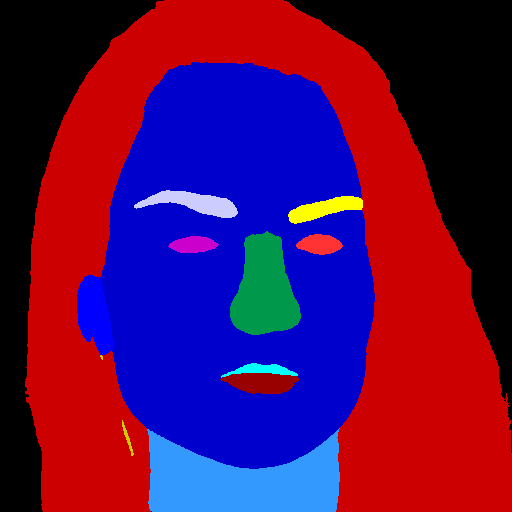

0.07378683566533374


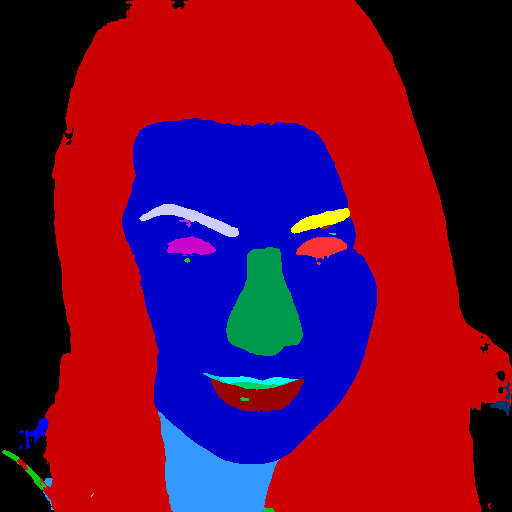

0.18108624864620734


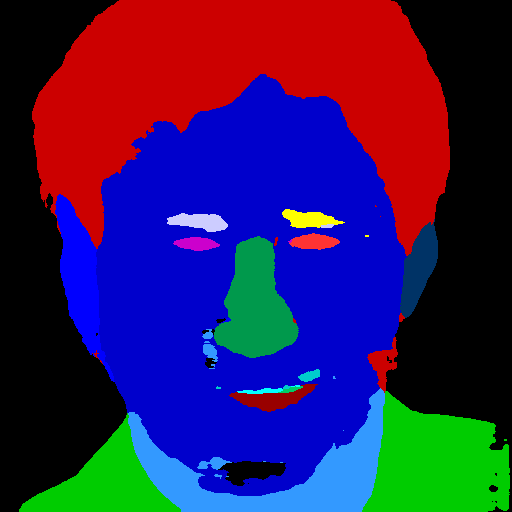

0.18581092577923225


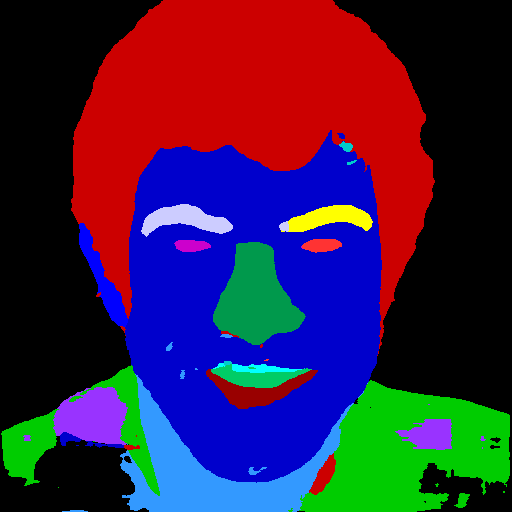

In [ ]:
from google.colab.patches import cv2_imshow
model = Unet(3,19)
model.load_state_dict(torch.load('seg_model.pth'))
criterion = torch.nn.CrossEntropyLoss()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
df_split = pd.read_csv('./CelebAMask-HQ/celeb_train_test_split.csv')
test_is = df_split[df_split.is_train == False]
test_names = test_is.name.values
i_paths = []
m_paths =[]
test_cases = test_names[105:110]
for i in range(5):    
  i_paths.append('./CelebAMask-HQ/CelebA-HQ-img/{}'.format(test_cases[i]))
  m_paths.append('./CelebAMask-HQ/CelebAMask-HQ-Mask/{}.png'.format(test_cases[i][:-4]))

inference2(model.to(device), i_paths, m_paths, criterion, device)

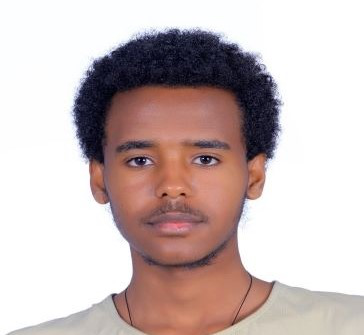

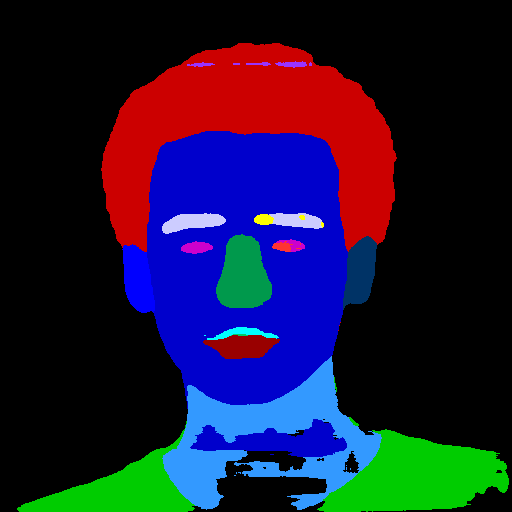

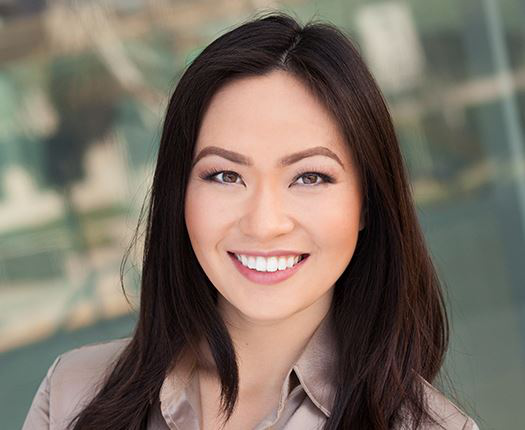

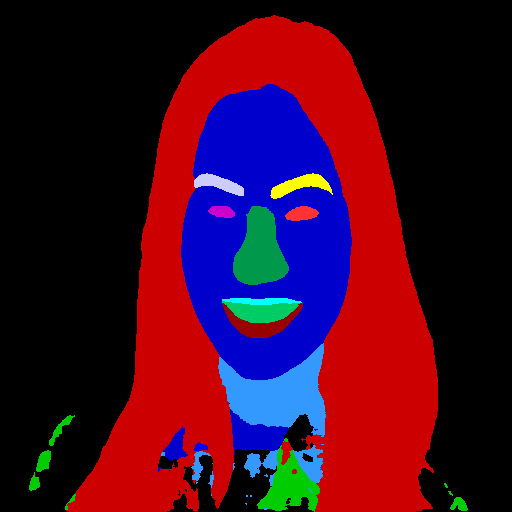

<Figure size 1000x700 with 0 Axes>

In [ ]:
inference3(model, ['Photo_1.jpg', 'Photo_2.jpg'], device)

I have first trained the model without augumentations and have found a mean intersection over union score of 0.678 and a mean dice score of 0.742. In my second experiment using image augumentations , I have implemented a gaussian blurring and ColorJitter features of pytorch transform but improvement wasn't observed which might be due to the fact that the number of epochs the model is trained small.Eventhough mean intersection over union is good overall for segmentation tasks, it doesn't provide an appropriate representation for imabalanced data which is our case as there are some classes that doesn't have many instances in the set. Dice score is better to close this gap. Also the model has generalized good to the images out of the set.

## Problem 2. Deep image prior (36 pts)

In the deep prior framework, we aim to learn a prior distribution over the parameters $\theta$ of a generative model such that, given some observation $\hat{y}$, we can sample a plausible output $y$ from the learned prior distribution. The goal is to learn a posterior distribution $p(z,\theta|\hat{y})$ over the latent variable $z$ and the parameters $\theta$ such that, given some observation $\hat{y}$ (e.g., an image of a face), we can sample a plausible latent variable $z$ and generate a corresponding output image $y= f_\theta(z)$ that is similar to the observation. The conditional distribution of $y$ given $\hat{y}$ can be written as an integral over $z$ and $\theta$:

$$p(y|\hat{y}) = \int p(y|z,\theta,\hat{y})p(z,\theta|\hat{y})dzd\theta$$

Unfortunately, in practice, it is difficult to compute this integral exactly, since we don't know the conditional distribution $p(y|z,\theta,\hat{y})$ and the posterior distribution $p(z,\theta|\hat{y})$. Instead, we can use an optimization approach to learn the prior distribution $p(z,\theta)$ and the network $f_\theta(z)$ that best approximate the true conditional distribution.

Specifically, we first assume that the latent variable $z$ is independent of the observation $\hat{y}$, i.e., $p(z,\theta|\hat{y}) = p(\theta|\hat{y})p(z)$. This allows us to rewrite the conditional distribution of $y$ as:

$$p(y|\hat{y}) = \int p(y|z,\theta,\hat{y})p(\theta|\hat{y})p(z)dzd\theta$$

Next, we use an optimization approach to learn the parameters $\theta$ of the network to minimize the expected distance between the generated output $y=f_\theta(z)$ and the observation $\hat{y}$:

$$\min_\theta E(f_\theta(z),\hat{y})$$

To perform this optimization, we can apply a stochastic gradient descent approach where we sample random values of $z$ from the prior distribution $p(z)$ and compute the gradients of the loss function with respect to $\theta$ using backpropagation. This way, we can iteratively update the parameters of the network to improve its ability to generate realistic outputs given the observed data.

This approach is used to perform denoising, inpainting and super resolution. The basic architecture for the task is UNet, which we will use in our experiments.

## Implementation

In [ ]:
import torch
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"
import torchvision
from torchvision import transforms
import gdown
from tqdm import tqdm
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from tqdm import tqdm
import random
from torchmetrics import TotalVariation as TV

In [ ]:
!pip install torchmetrics

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.2/519.2 kB 9.4 MB/s eta 0:00:00


In [ ]:
class Encoder_Block(torch.nn.Module):
    def __init__(self,inp_channels,out_channels):
        super().__init__()
        self.model = torch.nn.Sequential(
            torch.nn.Conv2d(inp_channels,out_channels,kernel_size=3,padding=1),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
            torch.nn.Conv2d(out_channels,out_channels,kernel_size=3,padding=1),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
        )
        self.downsample = torch.nn.MaxPool2d(2)
    def forward(self,x):
        int_out = self.model(x)
        return self.downsample(int_out), int_out

class Decoder_Block(torch.nn.Module):
    def __init__(self,inp_channels,out_channels):
        super().__init__()
        self.upsample = torch.nn.ConvTranspose2d(inp_channels,out_channels,kernel_size=2,stride=2)
        self.model = torch.nn.Sequential(
            torch.nn.Conv2d(inp_channels,out_channels,kernel_size=3,padding=1),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
            torch.nn.Conv2d(out_channels,out_channels,kernel_size=3,padding=1),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
        )
    def forward(self,x,enc_x):
        x = self.upsample(x)
        x = torch.cat([x,enc_x],dim=1)
        return self.model(x)

In [ ]:
class Unet(torch.nn.Module):
    def __init__(self,inc,outc,hidden_size=16):
        super().__init__()
        self.Encoder = torch.nn.ModuleList([
            Encoder_Block(inc,hidden_size),
            Encoder_Block(hidden_size,hidden_size*2),
            Encoder_Block(hidden_size*2,hidden_size*4),
            Encoder_Block(hidden_size*4,hidden_size*8),
        ])
        self.bottleneck = torch.nn.Sequential(
            torch.nn.Conv2d(hidden_size*8,hidden_size*16,kernel_size=1),
            torch.nn.BatchNorm2d(hidden_size*16),
            torch.nn.ReLU(),
            torch.nn.Conv2d(hidden_size*16,hidden_size*16,kernel_size=1),
            torch.nn.BatchNorm2d(hidden_size*16),
            torch.nn.ReLU()
        )
        self.Decoder = torch.nn.ModuleList([
            Decoder_Block(hidden_size*16,hidden_size*8),
            Decoder_Block(hidden_size*8,hidden_size*4),
            Decoder_Block(hidden_size*4,hidden_size*2),
            Decoder_Block(hidden_size*2,hidden_size*1),
        ])
        self.last_layer = torch.nn.Sequential(
            torch.nn.Conv2d(hidden_size,outc,kernel_size=3,padding="same"),
            torch.nn.Sigmoid()
        )
    def forward(self,x):
        enc_xs = []
        for module in self.Encoder:
            x, enc_x= module(x)
            enc_xs.append(enc_x)

        enc_xs = enc_xs[::-1]
        x = self.bottleneck(x)

        for i,module in enumerate(self.Decoder):
            x = module(x,enc_xs[i])
        return self.last_layer(x)

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
import gdown
sharing_link = "https://drive.google.com/file/d/1QMZ9_XdFRfj-arUvW_hlG5Mw8vjzTLsU/view?usp=share_link"
gdown.download(url=sharing_link, output="./data.zip", quiet=False, fuzzy=True)
!unzip ./data.zip

Downloading...
From: https://drive.google.com/uc?id=1QMZ9_XdFRfj-arUvW_hlG5Mw8vjzTLsU
To: /content/data.zip
100%|██████████| 1.60M/1.60M [00:00<00:00, 173MB/s]

Archive:  ./data.zip
   creating: data/
   creating: data/denoising/
  inflating: data/denoising/F16_GT.png  
  inflating: data/denoising/snail.jpg  
   creating: data/inpainting/
  inflating: data/inpainting/kate.png  
  inflating: data/inpainting/kate_mask.png  
  inflating: data/inpainting/library.png  
  inflating: data/inpainting/library_mask.png  
  inflating: data/inpainting/vase.png  
  inflating: data/inpainting/vase_mask.png  


In [ ]:
transform = transforms.Compose([
    transforms.ToTensor(),
])

In [ ]:
img = transform(Image.open("./data/denoising/F16_GT.png"))[None].to(device)

## Your work starts here

In [ ]:
noise_strength = 0.1
corrupted_img = (img + torch.randn_like(img)*noise_strength).clamp(0,1)

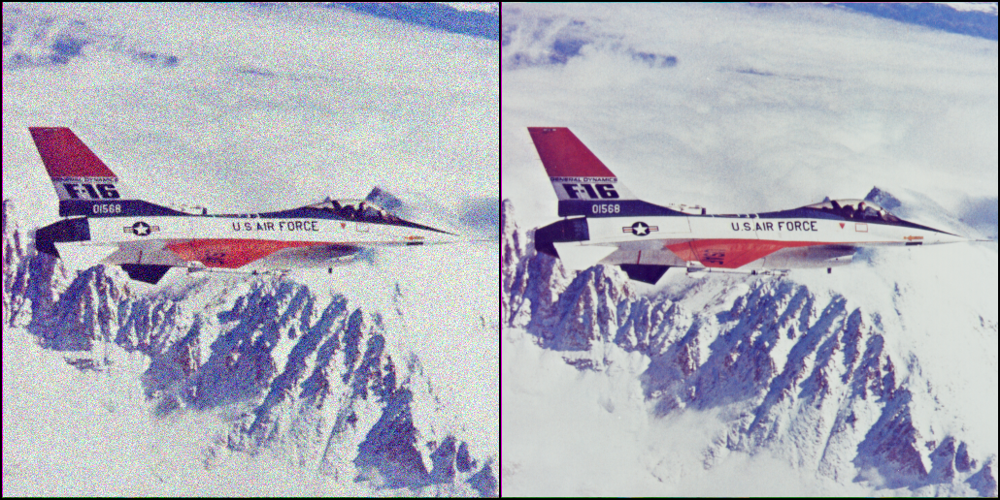

In [ ]:
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([corrupted_img,img],dim=0),nrow=2,normalize=True))

## Optimization (6 pts)

Task: Implement an optimization function that takes a model, input image, corrupted image, original image, and the number of iterations as arguments.

Steps:

1. Initialize an optimizer (Adam optimizer with learning rate $10^{-4}$).
2. Write a cycle for optimization using the specified loss function (criterion).
3. In each step of the cycle, add a certain amount of noise (reg_noise=0.01) to the input $z$ to ensure computational stability.

**We have provided baseline values for hyperparameters in this and future tasks, but feel free to make adjustments if needed.**

In [ ]:
def optimization(model,z,corrupted_img,orig_img,iters,criterion=torch.nn.MSELoss(),reg_noise=0.01):
    # your code is here
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
    noise = z.detach().clone()
    input = z
    loss_generated_orig = []
    loss_generated_corr = []
    for i in range(iters):
      optimizer.zero_grad()
      output = model(input)
      loss = criterion(output, corrupted_img)
      loss_ = criterion(output, orig_img)
      loss.backward()
      optimizer.step()

      input = z + noise.normal_() * reg_noise

      loss_generated_corr.append(loss.item())
      loss_generated_orig.append(loss_.item())

      if ((i+1) % 200) == 0:
        print('Iter {}/{}  loss : {}'.format(i+1, iters, loss))

    return loss_generated_corr, loss_generated_orig, output


### Run the optimization (6 pts):

1. Start by initializing the UNet model with 32 input channels, 3 output channels, and a hidden size of 16.
2. Create a model input of size (1, 32, img.size(2), img.size(3)) by sampling from a normal distribution with a mean of 0 and standard deviation of 0.1.
3. Train the model for 3000 iterations.
4. Plot the training convergence with the loss computed for both generated and corrupted images.
5. Plot the training convergence with the loss computed for both generated and original images.
6. Visualize the results, including the original image, the corrupted image, and the restored image.
7. Explain obtained results (**Hint: look closely at the plot from step 5**)

In [ ]:
# your code is here
de_model = Unet(32, 3).to(device)
input = 0.1 * torch.zeros([1, 32, img.size(2), img.size(3)]).normal_()
iters = 3000
loss_gen_corr, loss_gen_orig, out_img = optimization(de_model, input.to(device), corrupted_img, img, iters)

Iter 200/3000  loss : 0.015391455963253975
Iter 400/3000  loss : 0.011748152785003185
Iter 600/3000  loss : 0.010560819879174232
Iter 800/3000  loss : 0.010079563595354557
Iter 1000/3000  loss : 0.009677605703473091
Iter 1200/3000  loss : 0.00936826691031456
Iter 1400/3000  loss : 0.009038379415869713
Iter 1600/3000  loss : 0.008639282546937466
Iter 1800/3000  loss : 0.008187162689864635
Iter 2000/3000  loss : 0.007733927574008703
Iter 2200/3000  loss : 0.0073203155770897865
Iter 2400/3000  loss : 0.006955016404390335
Iter 2600/3000  loss : 0.00663016177713871
Iter 2800/3000  loss : 0.006347422953695059
Iter 3000/3000  loss : 0.006110453512519598


Text(0.5, 1.0, 'Original image loss')

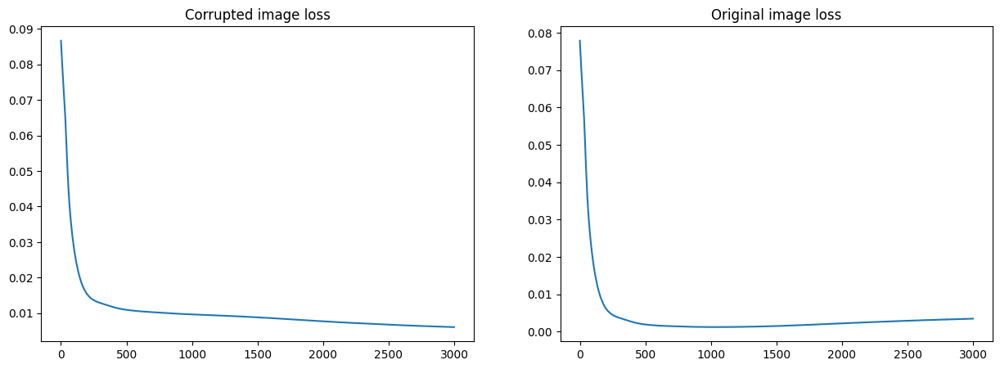

In [ ]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,5))
ax1.plot(np.arange(iters), loss_gen_corr)
ax1.set_title('Corrupted image loss')
ax2.plot(np.arange(iters), loss_gen_orig)
ax2.set_title('Original image loss')

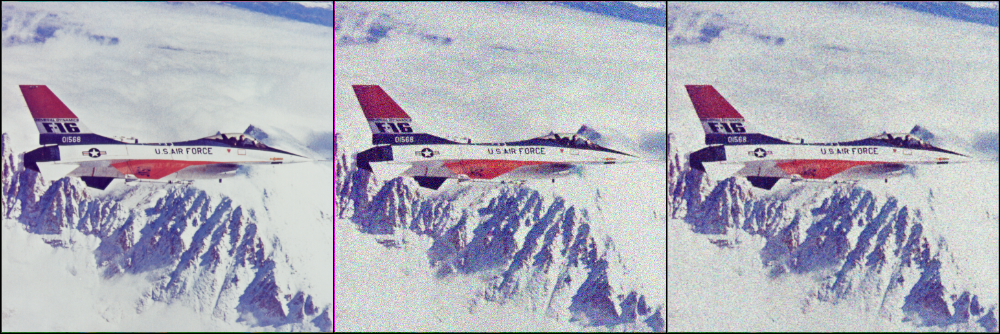

In [ ]:
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([img, corrupted_img,out_img],dim=0),nrow=3,normalize=True))

Closely looking in to the loss graph between the original image and the reconstructed one, we observe that the loss attains its minimmum at the 1024th iteration
which tells us that the generated image was near the original one at that point. Beyound that point the reconstructed image approaches the noisy one as also can be seen in the decaying loss graph between
the reconstructed image and the corrupted image.

## Early stopping (3 pts)

One solution to prevent the recurrence of past issues is by terminating the training process at an optimal point. However, determining the ideal number of iterations can be a challenging task. Therefore, your objective is to:

1. Find out appropriate number of iterations (the best reconstruction of original image)
2. Suggest stopping criteria for the denoising task in real case (when you do not know ground truth) (**Hint: use Total Variation metric to measure the amount of noise in the image**)
3. Compare the result of your strategy with found number of iterations in the first step

In [ ]:
# your code is here, find out appropriate number of iterations
best_recon = np.argmin(loss_gen_orig)
print(best_recon)

1024


In [ ]:
def optimization_modified(model,z,noised_img,orig_img,iters,criterion=torch.nn.MSELoss(), reg_noise=0.01):
    #duplicate your previous code and stop optimization according to stopping criteria
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
    noise = z.detach().clone()
    input = z
    tv = TV().to(device)
    loss_generated_orig = []
    loss_generated_corr = []
    tot_var = []
    min = np.inf
    idx = 0
    transform_ = transforms.Grayscale()
    for i in range(iters):
      optimizer.zero_grad()
      output = model(input)
      loss = criterion(output, corrupted_img)
      loss_ = criterion(output, orig_img)
      loss.backward()
      optimizer.step()

      input = z + noise.normal_() * reg_noise

      loss_generated_corr.append(loss.item())
      loss_generated_orig.append(loss_.item())
      # var = tv(output).item()
      # tot_var.append(tv(output).item())
      temp = tv(output).item()
      tot_var.append(temp)
      if i >= 999:
        last_thou = np.mean(tot_var[i-1000 + 1:i])
        if last_thou < min:
          min = last_thou
          # idx = i+1
        else:
          idx = i
          break

      if ((i+1) % 200) == 0:
        print('Iter {}/{}  loss : {}'.format(i+1, iters, loss))

    return loss_generated_corr, loss_generated_orig, tot_var, output, idx

In [ ]:
de_model_ = Unet(32, 3).to(device)
loss_c, loss_o, tot_var, o, min_idx = optimization_modified(de_model_, input.to(device), corrupted_img, img, iters)

Iter 200/3000  loss : 0.013846131041646004
Iter 400/3000  loss : 0.01119033433496952
Iter 600/3000  loss : 0.010351917706429958
Iter 800/3000  loss : 0.009930772706866264
Iter 1000/3000  loss : 0.009557521902024746


In [ ]:
print('The found number of iteration using early stopping: ', min_idx)

The found number of iteration using early stopping:  1173


The found number of iterations in early stopping is near to the previously obtained value. For this task I have experimented with different patience values and a change in the patience value can attribute to different results.

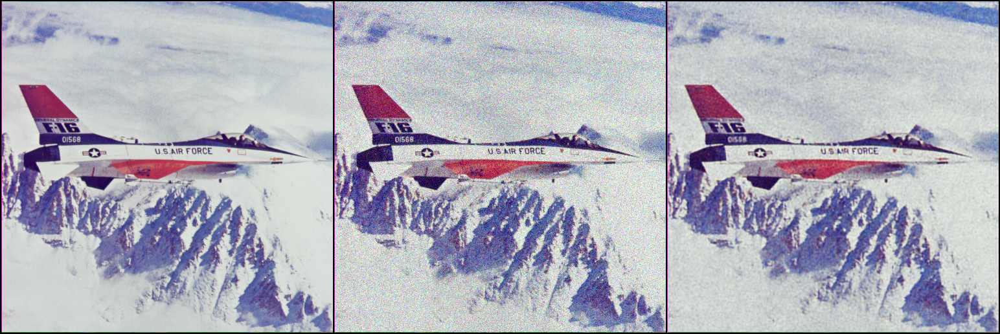

In [ ]:
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([img, corrupted_img,o],dim=0),nrow=3,normalize=True))

## Stochastic gradient Langevin dynamics (SGLD) optimization 

Another way to solve the problem of increasing the loss function over iterations is to adopt optimization procedure. In the explanations above we have already mentioned that the goal of deep prior is to evaluate the integral:

$$p(y|\hat{y}) = \int p(y|z,\theta,\hat{y})p(\theta|\hat{y})p(z)dzd\theta$$

Instead of directly solving the integral, we can use the Markov chain Monte Carlo (MCMC) method to estimate the posterior. This involves generating a sequence of correlated samples from the target distribution, which can converge to the true posterior during iterations. However, the MCMC approach can be slow and inefficient, and hence, using gradient-based optimization with noise can be a more effective solution. This involves minimizing the objective function and introducing noise to the gradient updates:

$$\theta_{i+1} = \theta_{i} + \mathrm{lr}\cdot\Delta_{i}^{\mathrm{standard}} + s\cdot\mathrm{lr}\cdot\epsilon$$

where $\Delta_{i}^{\mathrm{standard}}$ standard optimization update, $\mathrm{lr}$ - learning rate, $\epsilon \sim N(0,1)$, $s$ - strength of added noise.

More details of how and why it works described in [paper](https://arxiv.org/pdf/1904.07457.pdf)

### Implement SGLD (5 pts)

1. Take the previous implementation of the optimization procedure and adjust it to add noise to the model parameters after each iteration, but **only for convolutional layers**.
2. Set the strength of added noise to 4.
3. Plot the training convergence with the loss computed for generated and corrupted images.
4. Plot the training convergence with the loss computed for generated and original images.
5. Analyze and explain the results in comparison to the Early Stopping approach.
6. Try different values for the strength of added noise $s$ and comment the results.

In [ ]:
def SGLD(model,z,corrupted_img,orig_img,iters, noise_strength,criterion=torch.nn.MSELoss(),reg_noise=0.01): 
    # your code is here
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
    noise = z.detach().clone()
    input = z
    loss_generated_orig = []
    loss_generated_corr = []
    for i in range(iters):
      optimizer.zero_grad()
      output = model(input)
      loss = criterion(output, corrupted_img)
      loss_ = criterion(output, orig_img)
      loss.backward()

      loss_generated_corr.append(loss.item())
      loss_generated_orig.append(loss_.item())

      conv_params = [conv_param for conv_param in model.parameters() if len(conv_param.size()) == 4]
      for param in conv_params:
        a = torch.randn(param.size()) * noise_strength * 1e-4
        param.data = param.data + a.to(device)
      
      optimizer.step()
      input = z + noise.normal_() * reg_noise

      if ((i+1) % 200) == 0:
        print('Iter {}/{}  loss : {}'.format(i+1, iters, loss))

    return loss_generated_corr, loss_generated_orig, output

In [ ]:
# your code is here
dee_model = Unet(32, 3).to(device)
iters = 3000
noise_strength = 4
loss_gen_cc, loss_gen_oo, out_imgg = SGLD(dee_model, input.to(device), corrupted_img, img, iters, noise_strength)

Iter 200/3000  loss : 0.01831069216132164
Iter 400/3000  loss : 0.01253555715084076
Iter 600/3000  loss : 0.011404570192098618
Iter 800/3000  loss : 0.010773051530122757
Iter 1000/3000  loss : 0.010428868234157562
Iter 1200/3000  loss : 0.010186194442212582
Iter 1400/3000  loss : 0.010040895082056522
Iter 1600/3000  loss : 0.00991097278892994
Iter 1800/3000  loss : 0.009812373667955399
Iter 2000/3000  loss : 0.009697338566184044
Iter 2200/3000  loss : 0.009592369198799133
Iter 2400/3000  loss : 0.009488409385085106
Iter 2600/3000  loss : 0.00936335138976574
Iter 2800/3000  loss : 0.00925164669752121
Iter 3000/3000  loss : 0.00910673476755619


This approach works against the increasing loss function between the reconstructed image and original one. This can be shown in the right plot where the loss is comparably constant rather than increasing. Reconstructed image wise both the early stopping approach and the SGLD method has reconstructed a good image.

Text(0.5, 1.0, 'Original image loss')

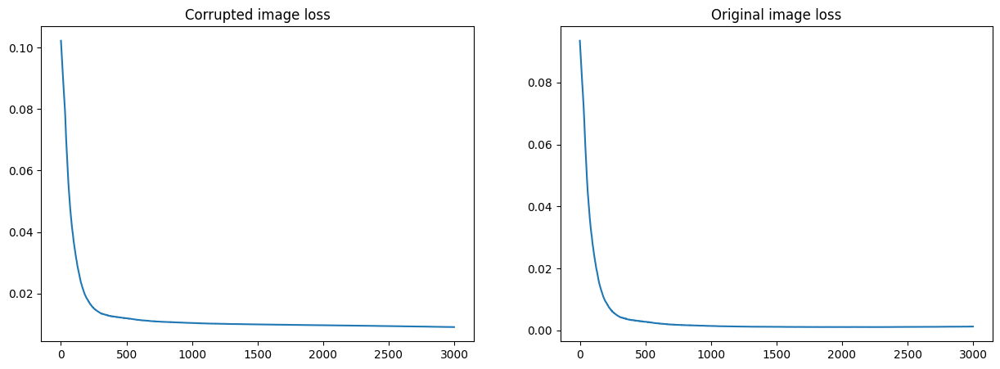

In [ ]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,5))
ax1.plot(np.arange(iters), loss_gen_cc)
ax1.set_title('Corrupted image loss')
ax2.plot(np.arange(iters), loss_gen_oo)
ax2.set_title('Original image loss')

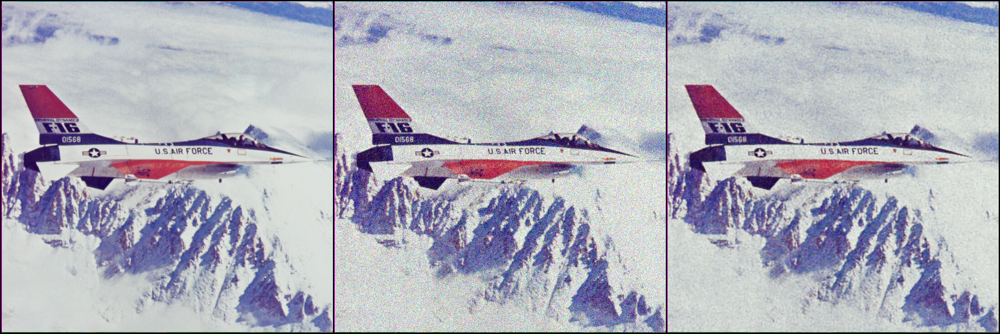

In [ ]:
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([img, corrupted_img,out_imgg],dim=0),nrow=3,normalize=True))

In [ ]:
noise_strength = 2 
de_model4 = Unet(32, 3).to(device)
loss_gen_corr, loss_gen_orig, out_img = SGLD(de_model4, input.to(device), corrupted_img, img, iters, noise_strength)

Iter 200/3000  loss : 0.022405153140425682
Iter 400/3000  loss : 0.012259466573596
Iter 600/3000  loss : 0.010768099687993526
Iter 800/3000  loss : 0.010231640189886093
Iter 1000/3000  loss : 0.009868264198303223
Iter 1200/3000  loss : 0.009608794003725052
Iter 1400/3000  loss : 0.009397315792739391
Iter 1600/3000  loss : 0.009157387539744377
Iter 1800/3000  loss : 0.008883628994226456
Iter 2000/3000  loss : 0.008543556556105614
Iter 2200/3000  loss : 0.008185504004359245
Iter 2400/3000  loss : 0.007809316273778677
Iter 2600/3000  loss : 0.007443418260663748
Iter 2800/3000  loss : 0.007120097056031227
Iter 3000/3000  loss : 0.006834074854850769


Text(0.5, 1.0, 'Original image loss')

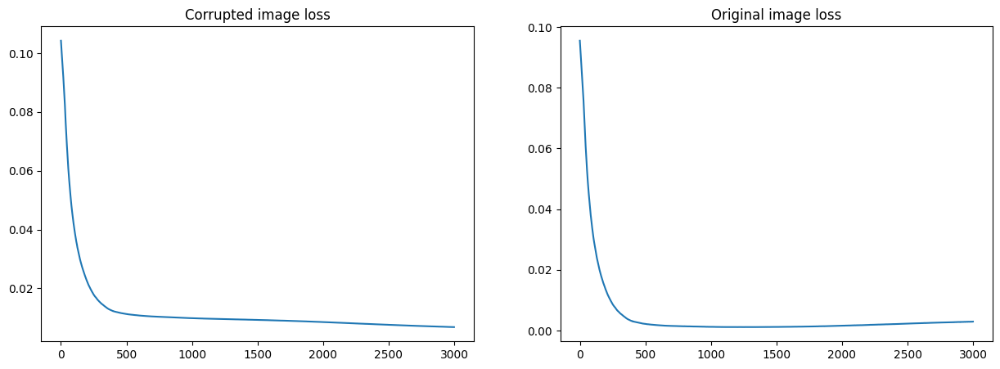

In [ ]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,5))
ax1.plot(np.arange(iters), loss_gen_corr)
ax1.set_title('Corrupted image loss')
ax2.plot(np.arange(iters), loss_gen_orig)
ax2.set_title('Original image loss')

In [ ]:
noise_strength = 6
de_model5 = Unet(32, 3).to(device)
loss_gen_corr, loss_gen_orig, out_img = SGLD(de_model5, input.to(device), corrupted_img, img, iters, noise_strength)

Iter 200/3000  loss : 0.017024895176291466
Iter 400/3000  loss : 0.013761186972260475
Iter 600/3000  loss : 0.012634186074137688
Iter 800/3000  loss : 0.011670554988086224
Iter 1000/3000  loss : 0.01108663808554411
Iter 1200/3000  loss : 0.01078865211457014
Iter 1400/3000  loss : 0.010647031478583813
Iter 1600/3000  loss : 0.010495091788470745
Iter 1800/3000  loss : 0.010356880724430084
Iter 2000/3000  loss : 0.01028931513428688
Iter 2200/3000  loss : 0.010188305750489235
Iter 2400/3000  loss : 0.010140126571059227
Iter 2600/3000  loss : 0.01005534827709198
Iter 2800/3000  loss : 0.00999307818710804
Iter 3000/3000  loss : 0.009916136972606182


2992

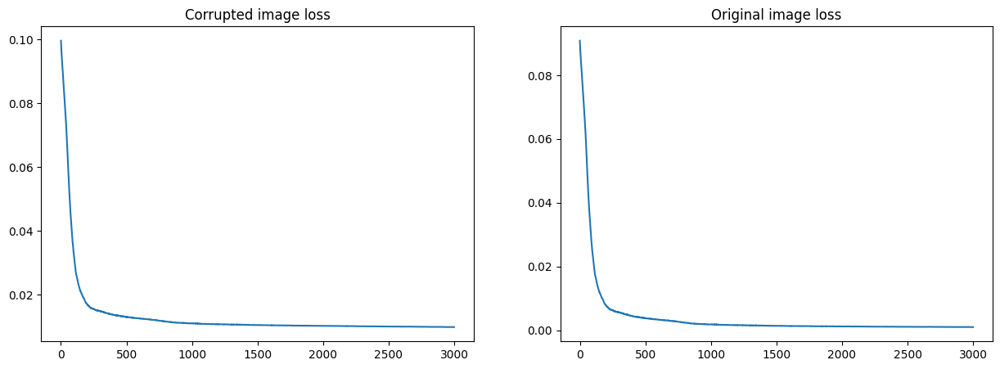

In [ ]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,5))
ax1.plot(np.arange(iters), loss_gen_corr)
ax1.set_title('Corrupted image loss')
ax2.plot(np.arange(iters), loss_gen_orig)
ax2.set_title('Original image loss')
np.argmin(loss_gen_orig)

A lower noise strength value than four doesn't help much to keep the loss non-increasing while a higher noise strength value resulted in a decreasing loss function to the last iteration.

## Inpainting

Deep Image Prior is a versatile tool that can be utilized in solving an important task such as image inpainting. In this task, the challenge lies in the inability to obtain values for the pixels that are damaged and defined by the mask. Thus, during the training process, it is essential to apply the mask to the generated image as these values are unavailable for this particular task. Furthermore, in order to effectively address this issue, you will try a more complex model called AttentionUNet. This model is similar to the UNet model in terms of structure but with the inclusion of attention blocks in the decoder part. 

### Attention block (10 pts)

For AttentionUNet implementation you only need to implement Attention layer. Attention should scale hidden output of encoder block which is also an input for the corresponding decoder block in order to draw more "attention" to particular image parts. Below we have placed the pipeline which you should implement:

**Input:** $skip$ of size [batch,skip_channels,H_skip,W_skip], $x$ of size [batch,x_channels,H_x,W_x]

**Output:** $skip^*$ of size [batch,skip_channels,H_skip,W_skip]

1. Apply 2d convolution with kernel size $2$ to $skip$ to make it of size [batch,skip_channels,H_x,W_x] (recall that 2H_x = H_skip, 2W_x = W_skip)
2. Apply 2d convolution with kernel size $1$ to $x$ to make it of size [batch,skip_channels,H_x,W_x]
3. Sum the outputs of previous two steps and apply ReLU over it.
4. Apply 2d convolution to previous output to reduce channel dimension to 1. So the output should have size equal [batch,1,H_x,W_x]
5. Apply Sigmoid to the previous output to get attention itself
6. Apply attention to the input $skip$ (original block input **NOT** the output of the first step) by simply multipling $skip$ by attention element-wise.

In [ ]:
class Attention(torch.nn.Module):
    def __init__(self,skip_channels, x_channels):
        super().__init__()
        # your code is here
        self.skip_conv = torch.nn.Conv2d(skip_channels, skip_channels, kernel_size=2, stride=2)
        self.x_conv = torch.nn.Conv2d(x_channels, skip_channels, kernel_size=1)
        self.red_conv = torch.nn.Sequential(
            torch.nn.ReLU(),
            torch.nn.Conv2d(skip_channels, 1, kernel_size=3, padding=1),
            torch.nn.Sigmoid(),
            torch.nn.ConvTranspose2d(1, 1, kernel_size=2, stride=2),
        )

    def forward(self,skip,x):
        # your code is here
        skip_ = self.skip_conv(skip)
        x = self.x_conv(x) + skip_
        attention = self.red_conv(x)
        enc_x = skip * attention 
        return enc_x


In [ ]:
class Decoder_Block_With_Attention(torch.nn.Module):
    def __init__(self,inp_channels,out_channels):
        super().__init__()
        self.upsample = torch.nn.ConvTranspose2d(inp_channels,out_channels,kernel_size=2,stride=2)
        self.model = torch.nn.Sequential(
            torch.nn.Conv2d(inp_channels,out_channels,kernel_size=3,padding=1),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
            torch.nn.Conv2d(out_channels,out_channels,kernel_size=3,padding=1),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
        )
        self.attention = Attention(out_channels,inp_channels)
    def forward(self,x,enc_x):
        enc_x = self.attention(enc_x,x)
        x = self.upsample(x)
        x = torch.cat([x,enc_x],dim=1)
        return self.model(x)


class AttentionUnet(torch.nn.Module):
    def __init__(self,inc,outc,hidden_size=16):
        super().__init__()
        self.Encoder = torch.nn.ModuleList([
            Encoder_Block(inc,hidden_size),
            Encoder_Block(hidden_size,hidden_size*2),
            Encoder_Block(hidden_size*2,hidden_size*4),
            Encoder_Block(hidden_size*4,hidden_size*8),
        ])
        self.bottleneck = torch.nn.Sequential(
            torch.nn.Conv2d(hidden_size*8,hidden_size*16,kernel_size=1),
            torch.nn.BatchNorm2d(hidden_size*16),
            torch.nn.ReLU(),
            torch.nn.Conv2d(hidden_size*16,hidden_size*16,kernel_size=1),
            torch.nn.BatchNorm2d(hidden_size*16),
            torch.nn.ReLU()
        )
        self.Decoder = torch.nn.ModuleList([
            Decoder_Block_With_Attention(hidden_size*16,hidden_size*8),
            Decoder_Block_With_Attention(hidden_size*8,hidden_size*4),
            Decoder_Block_With_Attention(hidden_size*4,hidden_size*2),
            Decoder_Block_With_Attention(hidden_size*2,hidden_size*1),
        ])
        self.last_layer = torch.nn.Sequential(
            torch.nn.Conv2d(hidden_size,outc,kernel_size=3,padding="same"),
            torch.nn.Sigmoid()
        )
    def forward(self,x):
        enc_xs = []
        for module in self.Encoder:
            x, enc_x= module(x)
            enc_xs.append(enc_x)

        enc_xs = enc_xs[::-1]
        x = self.bottleneck(x)

        for i,module in enumerate(self.Decoder):
          x = module(x,enc_xs[i])
        return self.last_layer(x)

In [ ]:
transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(256),
    transforms.ToTensor()
])

In [ ]:
img = transform(Image.open("./data/inpainting/library.png"))[None].to(device)
img_mask = transform(Image.open("./data/inpainting/library_mask.png"))[None].to(device)
corrupted_img = img * img_mask

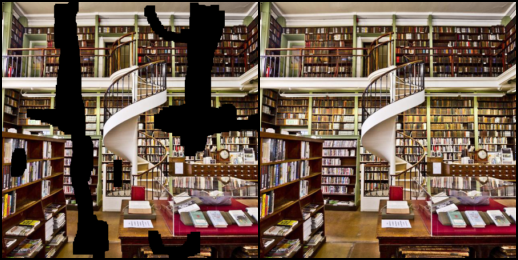

In [ ]:
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([corrupted_img,img],dim=0),nrow=2,normalize=True))

### Modify SGLD optimization (6 pts):
1. Take the code for SGLD and update loss calculation by applying mask to generated image (take $s$ = 4, lr = $4 \cdot 10^{-4}$, reg_noise = $0.2$, iters=$2000$)
2. Run the code and evaluate how well model fitted to known pixels and restore the missed one
3. Run the same code with standard UNet model and compare results with AttentionUNet. What conclusion can you make?


**Bonus task (4 pts)** Try to find optimal hyper parameters (strength of added noise $s$, learning rate, reg_noise, number of iterations)

In [ ]:
def optimization_inpainting(model,z,corrupted_img,mask,orig_img,iters,criterion=torch.nn.MSELoss(),reg_noise=0.2):
    #your code is here
    optimizer = torch.optim.Adam(model.parameters(), lr=4e-4)
    noise = z.detach().clone()
    input = z
    loss_generated_corr = []
    noise_strength = 4
    for i in range(iters):
      optimizer.zero_grad()
      output = model(input)
      loss = criterion(output * mask, corrupted_img)
      loss.backward()

      loss_generated_corr.append(loss.item())

      conv_params = [conv_param for conv_param in model.parameters() if len(conv_param.size()) == 4]
      for param in conv_params:
        a = torch.randn(param.size()) * noise_strength * 4e-4
        param.data = param.data + a.to(device)
      
      optimizer.step()
      input = z + noise.normal_() * reg_noise

      if ((i+1) % 200) == 0:
        print('Iter {}/{}  loss : {}'.format(i+1, iters, loss))

    return output

In [ ]:
nc = 2
model_without_attention = Unet(nc,3,hidden_size=16).to(device)
z = torch.cat(torch.meshgrid(torch.arange(img.size(2))/img.size(2),torch.arange(img.size(3))/img.size(3))).reshape(1,2,img.size(2),img.size(3)).to(device)

/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [ ]:
# your code is here
iters = 2000
output = optimization_inpainting(model_without_attention, z, corrupted_img, img_mask, img, iters)

Iter 200/2000  loss : 0.01250445656478405
Iter 400/2000  loss : 0.007789667695760727
Iter 600/2000  loss : 0.005842691287398338
Iter 800/2000  loss : 0.005152334924787283
Iter 1000/2000  loss : 0.004075621720403433
Iter 1200/2000  loss : 0.0036139560397714376
Iter 1400/2000  loss : 0.00323448795825243
Iter 1600/2000  loss : 0.0029098112136125565
Iter 1800/2000  loss : 0.0026282453909516335
Iter 2000/2000  loss : 0.002419119467958808


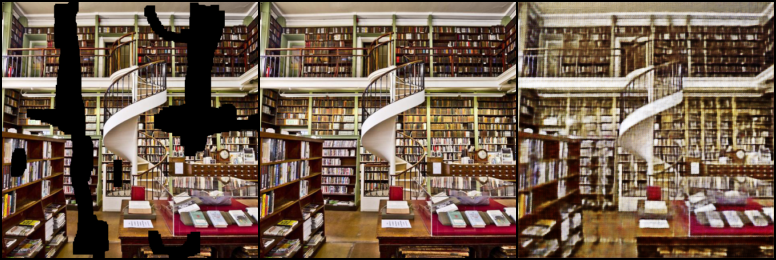

In [ ]:
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([corrupted_img,img, output],dim=0),nrow=3,normalize=True))

In [ ]:
nc = 2
model_with_attention = AttentionUnet(nc,3,hidden_size=16).to(device)
z = torch.cat(torch.meshgrid(torch.arange(img.size(2))/img.size(2),torch.arange(img.size(3))/img.size(3))).reshape(1,2,img.size(2),img.size(3)).to(device)

In [ ]:
# your code is here
iters = 2000
output = optimization_inpainting(model_with_attention, z, corrupted_img, img_mask, img, iters)

Iter 200/2000  loss : 0.009829237125813961
Iter 400/2000  loss : 0.006452514789998531
Iter 600/2000  loss : 0.005163402762264013
Iter 800/2000  loss : 0.004175773821771145
Iter 1000/2000  loss : 0.0036463241558521986
Iter 1200/2000  loss : 0.003448804374784231
Iter 1400/2000  loss : 0.003034263849258423
Iter 1600/2000  loss : 0.002776644192636013
Iter 1800/2000  loss : 0.002532276324927807
Iter 2000/2000  loss : 0.0023207550402730703


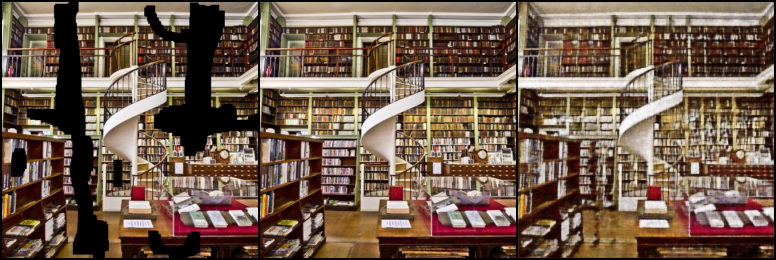

In [ ]:
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([corrupted_img,img, output],dim=0),nrow=3,normalize=True))

Eventhough the difference shown here is slight and is hard to differentiate with eye, the attention mechanism allows the network to focus on a specific region of the image and hence improve the performance by capturing detailed structures in the input image.

## Problem 3. Natural language generation (35 pts)

This problem requires uploading two csv files along with the solution notebook. Please compress these three files in zip archive and upload it in Canvas. 

Natural language generation (NLG) is a well-known research problem concerned with generating textual descriptions of structured data, such as tables, as output. Compared to machine translation, where the goal is to completely convert an input sentence into another language, NLG requires overcoming two different challenges: deciding what to say, by selecting a relevant subset of the input data to describe, and deciding how to say it, by generating text that flows and reads naturally. 

In this task you will need to generate table descriptions and titles for the dataset that can be downloaded from the [link](https://box.skoltech.ru/index.php/s/DRfJFNUJMgmLxOU). Your inference pipeline should receive `.csv` and output 2 strings: table description `text` and table title `title`.

As the solution to this task you shoud complete `submission.csv` and `submission_reranking.csv` files as below and report the link on your finetuned checkpoints.

In [ ]:
import pandas as pd

# data = pd.read_csv('./train.csv', index_col=0)
# data.head(10)

In [ ]:
sample = pd.read_csv('./data/12713542298181105208.csv', index_col=0)
sample

In [ ]:
sample = pd.read_csv('./data/1056174336234335.csv', index_col=0)
sample

In [ ]:
submission = pd.read_csv('./submission.csv', index_col=0)
submission.head(5)

- (**5 pts**) Propose and implement at least 2 variants of the input data preprocessing from tables to string data.
- (**5 pts**) Fine-tune [T5](https://huggingface.co/docs/transformers/model_doc/t5) as a baseline using `t5-base` checkpoint ([paper](https://arxiv.org/pdf/1910.10683.pdf)). In order to handle 2 types of output, test usage of prefixes for T5 model.
- (**5 pts**) Propose and implement at least 2 variants of data augmentation, retune T5 and compare performance.
- (**5 pts**) Add domain adoptation via additional Masked language modeling loss (MLM, [paper, section 3.1, Task #1](https://arxiv.org/pdf/1810.04805.pdf)) loss term for encoder, provide hyperparameter search for the regularization parameter $\lambda$, use BERTScore as objective, compare performance:
$$L(x, y) = -LogLikelihood(x, y) + \lambda L_{MLM}(x_{masked}, x)$$


The following metrics should be reported:
- [SacreBLEU](https://github.com/mjpost/sacrebleu)
- [ROUGEL](https://github.com/google-research/google-research/tree/master/rouge)
- [METEOR](https://www.nltk.org/_modules/nltk/translate/meteor_score.html)
- [BERTScore](https://github.com/Tiiiger/bert_score) using `bert-base-uncased` checkpoint and 9th layer output

Using the best checkpoint from above prepare submission file `submission.csv`, where index is a table caption from the `data` folder, and report the link on your finetuned checkpoint.

Method 1 : the table gets flatten into a sequence of words and used a
“key:value” format to preserve the structure. One row at a time is taken, and paired the cells with the corresponding column
header, then concatenate the header-cell
pairs in the same row using commas, and concatenate the rows using separator to
represent the entire table.

Method 2: the column headers will be instantiated first and by going row by row corresponding cells of it will be paired with brackets and the rows again will be separated by a separator.

In [ ]:
# Your code is here
class TableDataset():
  def __init__(self, tokenizer, source_length, text_length, title_length, train_path, data_path, mode):
    self.tokenizer= tokenizer
    self.source_length = source_length
    self.text_length = text_length
    self.title_length = title_length
    self.train_path = train_path
    self.mode= mode
    self.train_df = pd.read_csv(self.train_path, names=['file_num', 'text', 'title'], header=0)
    # self.test_df = pd.read_csv(self.test_path, )
    self.data_path = data_path
    self.dataset = []
    self.process_dataset()
    self.num_dataset = len(self.dataset)
  
  def __len__(self):
    return self.num_dataset
  
  def __getitem__(self, idx):
    file_num = self.dataset[idx]

    if self.mode:
      target_text_ = self.train_df[self.train_df['file_num'] == file_num]['text'].item()
      target_title_ = self.train_df[self.train_df['file_num'] == file_num]['title'].item()
      target_text = self.tokenizer.batch_encode_plus([target_text_], max_length=self.text_length, truncation=True, pad_to_max_length=True, return_tensors='pt')
      target_title = self.tokenizer.batch_encode_plus([target_title_], max_length=self.title_length, truncation=True, pad_to_max_length=True, return_tensors='pt')

    data_file = pd.read_csv(os.path.join(self.data_path, str(file_num)+'.csv'), index_col=0)
    table_data_text, table_data_title = self.preprocess1(data_file)

    
    source_text = self.tokenizer.batch_encode_plus([table_data_text], max_length=self.source_length, truncation=True, pad_to_max_length=True, return_tensors='pt')
    source_title = self.tokenizer.batch_encode_plus([table_data_title], max_length=self.source_length, truncation=True, pad_to_max_length=True, return_tensors='pt')

    if self.mode:
      return {
          'source_text_id' : source_text['input_ids'].squeeze(),
          'source_text_mask' : source_text['attention_mask'].squeeze(),
          'source_title_id' : source_title['input_ids'].squeeze(),
          'source_title_mask' : source_title['attention_mask'].squeeze(),
          'target_text_id' : target_text['input_ids'].squeeze(),
          'target_title_id' : target_title['input_ids'].squeeze()
      }
    else:
      return {
          'file_nums' : torch.tensor([file_num]),
          'source_text_id' : source_text['input_ids'].squeeze(),
          'source_text_mask' : source_text['attention_mask'].squeeze(),
          'source_title_id' : source_title['input_ids'].squeeze(),
          'source_title_mask' : source_title['attention_mask'].squeeze(),
      }

  def process_dataset(self):
    for file_num in self.train_df['file_num']:
      if os.path.exists(os.path.join(self.data_path, str(file_num)+'.csv')):
        self.dataset.append(file_num)
    
  def preprocess1(self, data_file):
    data = ''
    for idx,row in data_file.iterrows():
      for cols in range(len(data_file.columns)):
        data += '{}: {}'.format(data_file.columns[cols], row[data_file.columns[cols]])
        if cols == len(data_file.columns) - 1:
          data += ' [SEP] '
        else:
          data += ', '
    return 'summarize: ' + data, 'generate title: ' + data
    
  def preprocess2(self, data_file):
    data = '('
    for cols in range(len(data_file.columns)):
      data += cols
      if cols == len(data_file.columns) - 1:
          data += ')'
      else:
        data += ', '
    for idx,row in data_file.iterrows():
      data += ' ('
      for cols in range(len(data_file.columns)):
        data += '{} '.format(row[data_file.columns[cols]])
        if cols == len(data_file.columns) - 1:
          data += ')'
        else:
          data += ', '
      data += '[SEP]'

    return 'summarize: ' + data, 'generate title: ' + data
    
    


In [ ]:
!pip install bert-score

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.1/61.1 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 91.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 30.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 102.4 MB/s eta 0:00:00


In [ ]:
from bert_score import score

In [ ]:
!pip install sacrebleu

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 118.9/118.9 kB 9.1 MB/s eta 0:00:00


In [ ]:
!pip install rouge

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install transformers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached transformers-4.28.1-py3-none-any.whl (7.0 MB)


In [ ]:
%pip install sentencepiece

Defaulting to user installation because normal site-packages is not writeable


In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
def train(model, data_loader, tokenizer, optimizer, num_epochs, device):
  model.train()
  for epoch in range(num_epochs):
    print('epoch ', epoch)
    running_loss = 0
    for data in tqdm(data_loader):
      source_text_ids = data['source_text_id'].to(device)
      # print(source_text_ids.size())
      source_title_ids = data['source_title_id'].to(device)
      source_text_masks = data['source_text_mask'].to(device)
      source_title_masks = data['source_title_mask'].to(device)
      target_text_ids = data['target_text_id'].to(device)
      target_text_ids[target_text_ids == tokenizer.pad_token] = -100
      target_title_ids = data['target_title_id'].to(device)
      target_title_ids[target_title_ids == tokenizer.pad_token] = -100
      #handle target
      loss1 = model(input_ids=source_text_ids, attention_mask=source_text_masks, labels=target_text_ids)[0]
      loss2 = model(input_ids=source_title_ids, attention_mask=source_title_masks, labels=target_title_ids)[0]
      loss = loss1 + loss2
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()

      running_loss += loss.item()*source_text_ids.size(0)

    print('epoch_loss: ', running_loss / len(data_loader.dataset))



In [ ]:
from transformers import T5Tokenizer, T5ForConditionalGeneration
tokenizer = T5Tokenizer.from_pretrained('t5-base')
t5_model = T5ForConditionalGeneration.from_pretrained('t5-base')
train_path = './train.csv'
data_path = './data'
source_length = 512
text_length = 512
title_length = 256
train_dataset = TableDataset(tokenizer, source_length, text_length, title_length, train_path, data_path, True)
train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=2, shuffle=True, num_workers=0)
optimizer = torch.optim.Adam(params=t5_model.parameters(), lr=1e-4)
num_epochs = 1
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
train(t5_model.to(device), train_dataloader, tokenizer, optimizer, num_epochs, device)
from google.colab import drive
drive.mount('/content/drive')
%cd drive/MyDrive
torch.save(t5_model.state_dict(), 't5_model.pth')

epoch  0
epoch_loss:  0.5019948322667711


100%|██████████| 12661/12661 [3:34:27<00:00,  1.02s/it]


In [ ]:
import torch
torch.save(t5_model.state_dict(), 't5_model.pth')

Among the many techniques that can be used for table data augumentation I have used the following:
Row shuffling: this will create new table instances with different orderings of the same information. This can help the model learn to generalize better.

Random Cell masking: this will create new table instances with missing information. This can help the model learn to make more robust predictions and handle missing data


In [ ]:
# Your code is here
class TableDatasetWithAugumentation():
  def __init__(self, tokenizer, source_length, text_length, title_length, train_path, data_path, mode):
    self.tokenizer= tokenizer
    self.source_length = source_length
    self.text_length = text_length
    self.title_length = title_length
    self.train_path = train_path
    self.mode= mode
    self.train_df = pd.read_csv(self.train_path, names=['file_num', 'text', 'title'], header=0)
    self.data_path = data_path
    self.dataset = []
    self.process_dataset()
    self.num_dataset = len(self.dataset)
  
  def __len__(self):
    return self.num_dataset
  
  def __getitem__(self, idx):
    file_num = self.dataset[idx]
    if self.mode:
      target_text_ = self.train_df[self.train_df['file_num'] == file_num]['text'].item()
      target_title_ = self.train_df[self.train_df['file_num'] == file_num]['title'].item()
      target_text = self.tokenizer.batch_encode_plus([target_text_], max_length=self.text_length, truncation=True, pad_to_max_length=True, return_tensors='pt')
      target_title = self.tokenizer.batch_encode_plus([target_title_], max_length=self.title_length, truncation=True, pad_to_max_length=True, return_tensors='pt')

    data_file = pd.read_csv(os.path.join(self.data_path, str(file_num)+'.csv'), index_col=0)
    data_file = self.augument(data_file)
    table_data_text, table_data_title = self.preprocess1(data_file)

    
    source_text = self.tokenizer.batch_encode_plus([table_data_text], max_length=self.source_length, truncation=True, pad_to_max_length=True, return_tensors='pt')
    source_title = self.tokenizer.batch_encode_plus([table_data_title], max_length=self.source_length, truncation=True, pad_to_max_length=True, return_tensors='pt')
    if self.mode:
      return {
          'source_text_id' : source_text['input_ids'].squeeze(),
          'source_text_mask' : source_text['attention_mask'].squeeze(),
          'source_title_id' : source_title['input_ids'].squeeze(),
          'source_title_mask' : source_title['attention_mask'].squeeze(),
          'target_text_id' : target_text['input_ids'].squeeze(),
          'target_title_id' : target_title['input_ids'].squeeze()
      }
    else:
      return {
          'file_nums' : torch.tensor([file_num]),
          'source_text_id' : source_text['input_ids'].squeeze(),
          'source_text_mask' : source_text['attention_mask'].squeeze(),
          'source_title_id' : source_title['input_ids'].squeeze(),
          'source_title_mask' : source_title['attention_mask'].squeeze(),
      }

  def augument(self, data_file):
    mask_prob = 0.2
    if random.random() < 0.25:
      random_subset = data_file.sample(n=int(len(data_file)*mask_prob), random_state=42)
      i_i = random_subset.index.tolist()
      j_j = i_i
      random.shuffle(i_i)
      val = data_file.iloc[j_j]
      mask = data_file.index.isin(i_i)
      data_file.iloc[mask] = val

    data_file = data_file.mask(np.random.random(data_file.shape) < mask_prob)
    data_file = data_file.fillna('')
    return data_file

  def process_dataset(self):
    for file_num in self.train_df['file_num']:
      if os.path.exists(os.path.join(self.data_path, str(file_num)+'.csv')):
        self.dataset.append(file_num)
    
  def preprocess1(self, data_file):
    data = ''
    for idx,row in data_file.iterrows():
      for cols in range(len(data_file.columns)):
        data += '{}: {}'.format(data_file.columns[cols], row[data_file.columns[cols]])
        if cols == len(data_file.columns) - 1:
          data += ' [SEP] '
        else:
          data += ', '
    return 'summarize: ' + data, 'generate title: ' + data   


In [ ]:
#!g1.1
from transformers import T5Tokenizer, T5ForConditionalGeneration
tokenizer = T5Tokenizer.from_pretrained('t5-base')
t5_model_augu = T5ForConditionalGeneration.from_pretrained('t5-base')
train_path = './train.csv'
data_path = './data'
source_length = 512
text_length = 512
title_length = 256
train_dataset_augu = TableDatasetWithAugumentation(tokenizer, source_length, text_length, title_length, train_path, data_path, True)
train_dataloader_augu = torch.utils.data.DataLoader(train_dataset_augu, batch_size=2, shuffle=True, num_workers=0)
optimizer = torch.optim.Adam(params=t5_model_augu.parameters(), lr=1e-4)
num_epochs = 1
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
train(t5_model_augu.to(device), train_dataloader_augu, tokenizer, optimizer, num_epochs, device)
# from google.colab import drive
# drive.mount('/content/drive')
# %cd drive/MyDrive
# torch.save(t5_model.state_dict(), 't5_model.pth')

/home/jupyter/.local/lib/python3.8/site-packages/scipy/__init__.py:155: UserWarning: A NumPy version >=1.18.5 and <1.25.0 is required for this version of SciPy (detected version 1.18.0
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"



epoch  0


  0%|          | 0/12661 [00:00<?, ?it/s]/usr/local/lib/python3.8/dist-packages/transformers/tokenization_utils_base.py:2221: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  warnings.warn(
100%|██████████| 12661/12661 [1:29:09<00:00,  2.37it/s]

epoch_loss:  0.5127856111366773


In [ ]:
import torch.nn as nn
class ClassificationHead(nn.Module):
    def __init__(self, hidden_size, output_size):
        super().__init__()
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        x = self.fc(x)
        return x

In [ ]:
# Your code is here
class TableDatasetWithMask():
  def __init__(self, tokenizer, source_length, text_length, title_length, train_path, data_path, mode, mask_percentage=0.15):
    self.tokenizer= tokenizer
    self.source_length = source_length
    self.text_length = text_length
    self.title_length = title_length
    self.train_path = train_path
    self.mode= mode
    self.mask_percentage= mask_percentage
    self.train_df = pd.read_csv(self.train_path, names=['file_num', 'text', 'title'], header=0)
    self.data_path = data_path
    self.dataset = []
    self.process_dataset()
    self.num_dataset = len(self.dataset)
  
  def __len__(self):
    return self.num_dataset
  
  def __getitem__(self, idx):
    file_num = self.dataset[idx]
    if self.mode:
      target_text_ = self.train_df[self.train_df['file_num'] == file_num]['text'].item()
      target_title_ = self.train_df[self.train_df['file_num'] == file_num]['title'].item()
      target_text = self.tokenizer.batch_encode_plus([target_text_], max_length=self.text_length, truncation=True, pad_to_max_length=True, return_tensors='pt')
      target_title = self.tokenizer.batch_encode_plus([target_title_], max_length=self.title_length, truncation=True, pad_to_max_length=True, return_tensors='pt')

    data_file = pd.read_csv(os.path.join(self.data_path, str(file_num)+'.csv'), index_col=0)
    data = self.preprocess1(data_file)
    table_data_text = 'summarize: ' + data
    table_data_title = 'generate title: ' + data
    input_ = self.tokenizer.batch_encode_plus([data], max_length=self.source_length, truncation=True, pad_to_max_length=True, return_tensors='pt')
    orig_data = self.masking_func(data)
    input = self.tokenizer.batch_encode_plus([orig_data], max_length=self.source_length, truncation=True, pad_to_max_length=True, return_tensors='pt')
    input_ids = input['input_ids']
    input_attention_mask = input['attention_mask']

    source_text = self.tokenizer.batch_encode_plus([table_data_text], max_length=self.source_length, truncation=True, pad_to_max_length=True, return_tensors='pt')
    source_title = self.tokenizer.batch_encode_plus([table_data_title], max_length=self.source_length, truncation=True, pad_to_max_length=True, return_tensors='pt')
    if self.mode:
      return {
          'source_data_id_nonmasked' : input_['input_ids'].squeeze().to(dtype=torch.long),
          'source_data_id' : input_ids.squeeze().to(dtype=torch.long),
          'source_data_mask' : input_attention_mask.squeeze().to(dtype=torch.long),
          'source_text_id' : source_text['input_ids'].squeeze().to(dtype=torch.long),
          'source_text_mask' : source_text['attention_mask'].squeeze().to(dtype=torch.long),
          'source_title_id' : source_title['input_ids'].squeeze().to(dtype=torch.long),
          'source_title_mask' : source_title['attention_mask'].squeeze().to(dtype=torch.long),
          'target_text_id' : target_text['input_ids'].squeeze().to(dtype=torch.long),
          'target_title_id' : target_title['input_ids'].squeeze().to(dtype=torch.long)
      }
    else:
      return {
          'source_text_id' : source_text['input_ids'].squeeze(),
          'source_text_mask' : source_text['attention_mask'].squeeze(),
          'source_title_id' : source_title['input_ids'].squeeze(),
          'source_title_mask' : source_title['attention_mask'].squeeze(),
      }

  def process_dataset(self):
    for file_num in self.train_df['file_num']:
      if os.path.exists(os.path.join(self.data_path, str(file_num)+'.csv')):
        self.dataset.append(file_num)

  def masking_func(self, data):
    masking_percentage = 0.2
    b = data.split(' ')
    c = len(b)
    d = int(c * masking_percentage)
    e = random.sample(range(c), d)
    idx=0
    for i in range(len(e)):
      b[e[i]] = '<extra_id_{}>'.format(idx)
      if idx == 99:
        idx = 0
      else:
        idx += 1
    g = ' '.join(b)
    return g

  def preprocess1(self, data_file):
    data = ''
    for idx,row in data_file.iterrows():
      for cols in range(len(data_file.columns)):
        data += '{}: {}'.format(data_file.columns[cols], row[data_file.columns[cols]])
        if cols == len(data_file.columns) - 1:
          data += ' [SEP] '
        else:
          data += ', '
    return data


In [ ]:
from bert_score import score
def masked_train(model, classifier, data_loader, tokenizer, optimizer, num_epochs, device):
  model.train()
  for epoch in range(num_epochs):
    print('epoch ', epoch)
    running_loss = 0
    for data in tqdm(data_loader):
      source_data_ids_orig = data['source_data_id_nonmasked'].to(device),
      source_data_ids = data['source_data_id'].to(device),
      source_data_masks = data['source_data_mask'].to(device),
      source_text_ids = data['source_text_id'].to(device),
      source_title_ids = data['source_title_id'].to(device)
      source_text_masks = data['source_text_mask'].to(device)
      source_title_masks = data['source_title_mask'].to(device)
      target_text_ids = data['target_text_id'].to(device)
      target_text_ids[target_text_ids == tokenizer.pad_token] = -100
      target_title_ids = data['target_title_id'].to(device)
      target_title_ids[target_title_ids == tokenizer.pad_token] = -100

      loss1 = model(input_ids=source_text_ids[0], attention_mask=source_text_masks, labels=target_text_ids)[0]
      loss2 = model(input_ids=source_title_ids, attention_mask=source_title_masks, labels=target_title_ids)[0]
      encoder = model.get_encoder()
      encoder_outputs = encoder(input_ids=source_data_ids[0], attention_mask=source_data_masks[0])
      encoder_outputs = encoder_outputs.last_hidden_state
      logits = classifier(encoder_outputs)
      logits_ = torch.argmax(logits, dim=-1)
      out = tokenizer.batch_decode(logits_, skip_special_tokens=True)
      target = tokenizer.batch_decode(source_data_ids_orig[0], skip_special_tokens=True)
      _, _, f1 = score(out, target, lang='en', model_type='bert-base-uncased')
      loss_m = f1.mean()

      loss = loss1 + loss2 - loss_m
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()

      running_loss += loss.item()*source_text_ids[0].size(0)

    print('epoch_loss: ', running_loss / len(data_loader.dataset))

In [ ]:
#!g1.1
from transformers import T5Tokenizer, T5ForConditionalGeneration
tokenizer = T5Tokenizer.from_pretrained('t5-base')
t5_masked_model = T5ForConditionalGeneration.from_pretrained('t5-base')
train_path = './train.csv'
data_path = './data'
source_length = 512
text_length = 512
title_length = 256
train_dataset_mask = TableDatasetWithMask(tokenizer, source_length, text_length, title_length, train_path, data_path, True)
train_dataloader_mask = torch.utils.data.DataLoader(train_dataset_mask, batch_size=2, shuffle=True, num_workers=0)
classifier = ClassificationHead(t5_masked_model.config.hidden_size, tokenizer.vocab_size)
optimizer = torch.optim.Adam(params=t5_masked_model.parameters(), lr=1e-4)
num_epochs = 1
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
masked_train(t5_masked_model.to(device), classifier.to(device), train_dataloader_mask, tokenizer, optimizer, num_epochs, device)





epoch  0







ed if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
 11%|█         | 1334/12661 [2:44:46<22:03:18,  7.01s/it]Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.transform.dense.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.decoder.weight', 'cls.predictions.transform.dense.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or wit

KeyboardInterrupt: 

In [ ]:
#This function fills the submission file I have filled around 65% of the file because of computing unit limits
file_df = pd.read_csv('./submission.csv', names=['file_num', 'text', 'title'], header=0)
def test(model, data_loader, tokenizer, device, file):
  global file_df
  model.eval()
  with torch.inference_mode():
    for data in tqdm(data_loader):
      file_nums = data['file_nums']
      source_text_ids = data['source_text_id'].to(device)
      source_text_masks = data['source_text_mask'].to(device)
      source_title_ids = data['source_title_id'].to(device)
      source_title_masks = data['source_title_mask'].to(device)
      generated_summary = model.generate(input_ids=source_text_ids, attention_mask=source_text_masks, max_length=512, num_beams=2,repetition_penalty=2.5, length_penalty=1.0, early_stopping=True)
      generated_title = model.generate(input_ids=source_title_ids, attention_mask=source_title_masks, max_length=256, num_beams=2,repetition_penalty=2.5, length_penalty=1.0, early_stopping=True)
      preds_text = [tokenizer.decode(g, skip_special_tokens=True, clean_up_tokenization_spaces=True) for g in generated_summary]
      preds_title = [tokenizer.decode(g, skip_special_tokens=True, clean_up_tokenization_spaces=True) for g in generated_title]
      for i in range(len(file_nums)):
        file_df['text'][file_df['file_num'] == file_nums[i][0].item()] = preds_text[i]
        file_df['title'][file_df['file_num'] == file_nums[i][0].item()] = preds_title[i]
    return file_df 

In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
#!g1.1
from transformers import T5Tokenizer, T5ForConditionalGeneration
tokenizer = T5Tokenizer.from_pretrained('t5-base')
t5_model = T5ForConditionalGeneration.from_pretrained('t5-base')
t5_model.load_state_dict(torch.load('./t5_model.pth'))
test_path = './submission.csv'
data_path = './data'
source_length = 512
text_length = 512
title_length = 256
test_dataset = TableDataset(tokenizer, source_length, text_length, title_length, test_path, data_path, False)
test_dataloader = torch.utils.data.DataLoader(test_dataset, batch_size=2, shuffle=False, num_workers=0)
optimizer = torch.optim.Adam(params=t5_model.parameters(), lr=1e-4)
num_epochs = 1
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
returned_df = test(t5_model.to(device), test_dataloader, tokenizer, device, test_path)
returned_df.to_csv('to_be_submitted.csv', index=False)

/home/jupyter/.local/lib/python3.8/site-packages/scipy/__init__.py:155: UserWarning: A NumPy version >=1.18.5 and <1.25.0 is required for this version of SciPy (detected version 1.18.0
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


  0%|          | 0/5432 [00:00<?, ?it/s]/usr/local/lib/python3.8/dist-packages/transformers/tokenization_utils_base.py:2221: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  warnings.warn(
<ipython-input-1-7fad1cf56e02>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<ipython-input-1-7fad1cf56e02>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: ht

KeyboardInterrupt: 

In [ ]:
import nltk
from nltk.tokenize import word_tokenize
from nltk.translate.meteor_score import meteor_score

# download the required resources
nltk.download('wordnet')
nltk.download('punkt')

def evaluate_score(model, data_loader, tokenizer, device, file):
  bleu_s = 0
  bleu_t = 0
  meteor_s = 0
  meteor_t = 0
  roug_s = 0
  roug_t = 0
  bert_s = 0
  bert_t = 0
  rouge = Rouge()
  data_size = 0
  for data in tqdm(data_loader):
      source_text_ids = data['source_text_id'].to(device)
      source_text_masks = data['source_text_mask'].to(device)
      source_title_ids = data['source_title_id'].to(device)
      source_title_masks = data['source_title_mask'].to(device)
      label_text_id = data['target_text_id']
      label_title_id = data['target_title_is']
      label_text = tokenizer.batch_decode(label_text_id, skip_special_tokens=True)
      label_title = tokenizer.batch_encode(label_title_id, skip_special_tokens=True)
      generated_summary = model.generate(input_ids=source_text_ids, attention_mask=source_text_masks, max_length=512, num_beams=2,repetition_penalty=2.5, length_penalty=1.0, early_stopping=True)
      generated_title = model.generate(input_ids=source_title_ids, attention_mask=source_title_masks, max_length=256, num_beams=2,repetition_penalty=2.5, length_penalty=1.0, early_stopping=True)
      preds_text = [tokenizer.decode(g, skip_special_tokens=True, clean_up_tokenization_spaces=True) for g in generated_summary]
      preds_title = [tokenizer.decode(g, skip_special_tokens=True, clean_up_tokenization_spaces=True) for g in generated_title]

      cand = ['The cat sat on the mat.', 'The dog ate the bone.']
      ref = ['The cat sat on the mat.', 'The dog chewed on the bone.']
      bleu_ = sacrebleu.corpus_bleu(preds_text, [label_text]).score
      bleu__ = sacrebleu.corpus_bleu(preds_title, [label_title]).score
      bleu_s += bleu_* source_text_ids.size(0)
      bleu_t += bleu__* source_text_ids.size(0)
      p_, r_, f1_ = bert_score.score(preds_text, label_text, lang='en', verbose=False)
      p__, r__, f1__ = bert_score.score(preds_title, label_title, lang='en', verbose=False)
      bert_s += f1_.mean()*source_text_ids.size(0)
      bert_t += f1__.mean()*source_text_ids.size(0)
      rouge_ = rouge.get_scores(preds_text, label_text, avg=True)['rouge-l']['f']
      rouge__ = rouge.get_scores(preds_title, label_title, avg=True)['rouge-l']['f']
      roug_s += rouge_*source_text_ids.size(0)
      roug_t += rouge__*source_text_ids.size(0)

      label_tokens_, label_tokens__ = word_tokenize(label_text), word_tokenize(label_title)
      pred_tokens_, pred_tokens__ = word_tokenize(preds_text), word_tokenize(preds_title)

      meteor_ = meteor_score([label_tokens_], pred_tokens_)
      meteor__ = meteor_score([label_tokens__], pred_tokens__)
      meteor_s += meteor_*source_text_ids.size(0)
      meteor_t += meteor__*source_text_ids.size(0)
      data_size += source_text_ids.size(0)
      print('Sacre summary: {} , Sacre title: {}'.format(bleu_s/data_size, bleu_t/data_size))
      print('Bert summary: {} , Bert title: {}'.format(bert_s/data_size, bert_t/data_size))
      print('Rouge summary: {} , Rouge title: {}'.format(roug_s/data_size, roug_t/data_size))
      print('Meteor summary: {} , Meteor title: {}'.format(meteor_s/data_size, meteor_t/data_size))



[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [1]:
#!g1.1
from transformers import T5Tokenizer, T5ForConditionalGeneration
tokenizer = T5Tokenizer.from_pretrained('t5-base')
t5_model = T5ForConditionalGeneration.from_pretrained('t5-base')
t5_model.load_state_dict(torch.load('./t5_model.pth'))
train_path = './train.csv'
data_path = './data'
source_length = 512
text_length = 512
title_length = 256
train_dataset = TableDataset(tokenizer, source_length, text_length, title_length, train_path, data_path, True)
train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=2, shuffle=True, num_workers=0)
# optimizer = torch.optim.Adam(params=t5_model.parameters(), lr=1e-4)
# num_epochs = 1
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
evaluate_score(t5_model.to(device), train_dataloader, tokenizer, device)
# returned_df.to_csv('to_be_submitted.csv', index=False)

## Reranking approach (15 pts)

Using maximum likelihood, an ideal model will assign all probability mass to the reference summary. During inference, the model must also generate the output based on possibly erroneous previous steps. This can affect the performance of the model, a phenomenon often called exposure bias. One way to solve this problem is to require our model to be able to accurately predict the ranking order of a set of most likely candidates via an additional contrastive loss term

$$L(x, y) = -LogLikelihood(x, y) + L_{contrastive}(x, y)$$

where

$$
L_{contrastive}(x, y) = \sum_i\sum_{j < i}\max(0, f(s_i(x)) - f(s_j(x)) + \alpha_{ij})
$$

where $\alpha_{ij} = \alpha \cdot (i - j)$ is a margin, $s_i$ and $s_j$ are different candidates (generated by [beam search](https://huggingface.co/blog/how-to-generate)) such that for selected ranking function $r$ $r(s_j, y) > r(s_i, y)$, and 
$f(s)$ is a length-normalised estimated log-probability:

$$
f(s) = \frac{\sum_{t} LogProb(s_t| s_{<t}, x)}{|x|},
$$

where $|x|$ is a lenght of $x$.

Your task is to fine-tune the model with reranking-aware loss using BERTScore as the ranking function $r$, provide hyperparameter search for the margin scaling factor $\alpha$ using BERTScore as objective, report metrics for the best case (SacreBLEU, ROUGEL, METEOR, BERTScore), and prepare the submission file `submission_reranking.csv` and report the link on your finetuned checkpoint.

In [ ]:
# Your code is here